In [23]:
import pandas as pd
import scipy
from scipy import stats
import diffupy
from network_analysis import *
from matplotlib import pyplot
import random
from plotting import *
from phospho_analysis import *
import sys

# temp fix for dark preview pane problem
# pyplot.style.use('dark_background')

# autoload modules, so that if code changes in library it's reflected
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load network and phospho data

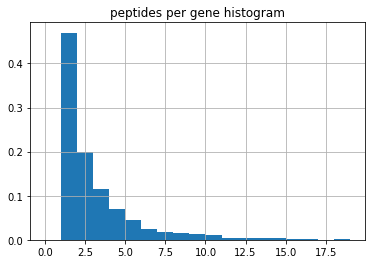

Common protein ids: 951, out of 1595 in phospho data and 6732 in network


In [33]:
ppi = read_network("data/BIOGRID-PUBLICATION-13022-4.1.190.tab3.txt")
phospho_data = read_phospho_data("data/final_ascored_pep_tgr09076_09614.csv")
#np.median deletes columns. Use pd.DataFrame.median instead
phospho_data = aggregate_peptide_values(phospho_data, agg=best_per_protein) 
phospho_data = restrict_to_common_ids(phospho_data, ppi)

seed = 45
# random.seed(seed)
# ppi = ppi.subgraph(random.sample(sorted(phospho_data.index), 700))

## Network and phospho data properties

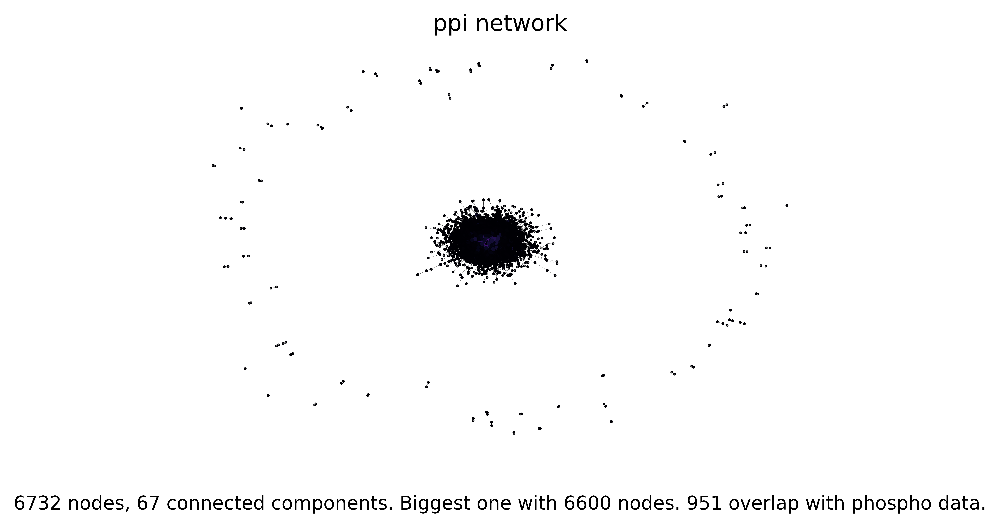

Common protein ids: 936, out of 951 in phospho data and 6600 in network


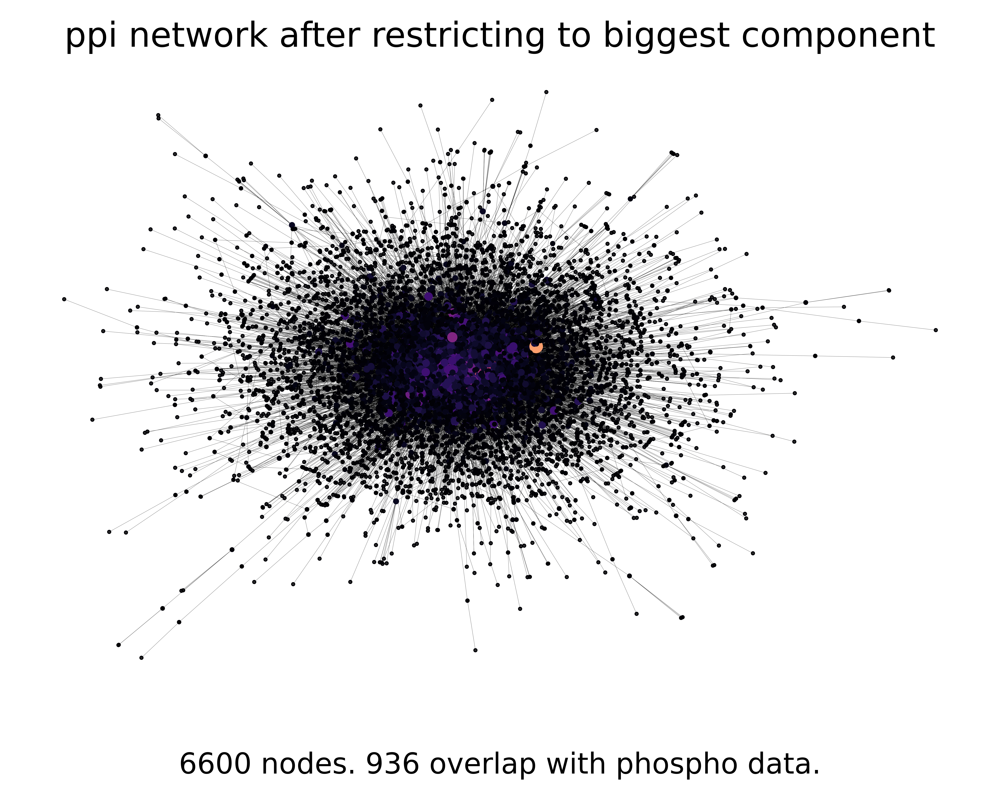

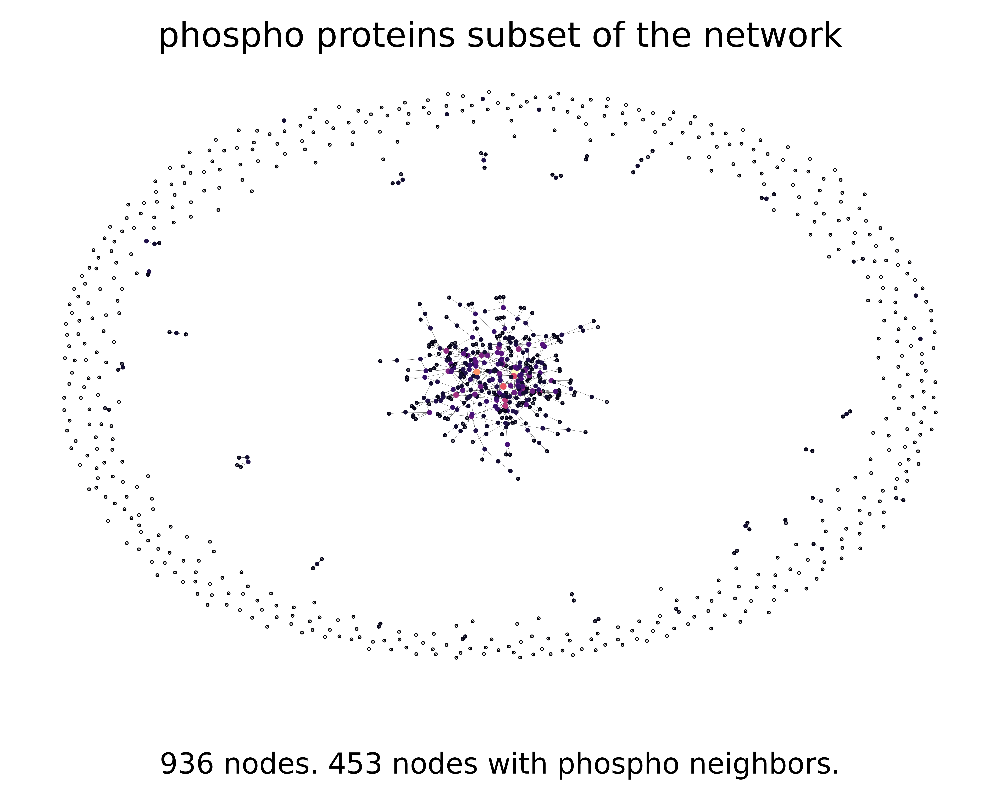

In [35]:
components = list(networkx.connected_components(ppi))

title = "ppi network"
text = """{} nodes, {} connected components. Biggest one with {} nodes. {} overlap with phospho data.""".format(
    len(ppi), len(components), len(components[0]), len(phospho_data))
plot_network(ppi, title, text)
# plotting.plot_network_visjs2jupyter(ppi, title, text)

ppi = ppi.subgraph(components[0]).copy()
phospho_data = restrict_to_common_ids(phospho_data, ppi)

title = "ppi network after restricting to biggest component"
text = """{} nodes. {} overlap with phospho data.""".format(len(ppi), len(phospho_data))
plot_network(ppi, title, text)
# plotting.plot_network_visjs2jupyter(ppi, title, text)

common_subgraph = ppi.subgraph(phospho_data.index).copy()
n_connected = len([d for d in common_subgraph.degree if d[1] > 0])
title = "phospho proteins subset of the network"
text = """{} nodes. {} nodes with phospho neighbors.""".format(len(common_subgraph), n_connected)
plot_network(common_subgraph, title, text)
# plotting.plot_network_visjs2jupyter(ppi, title, text)

## Histograms of values

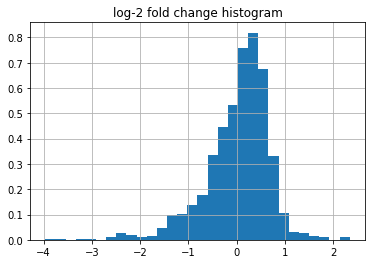

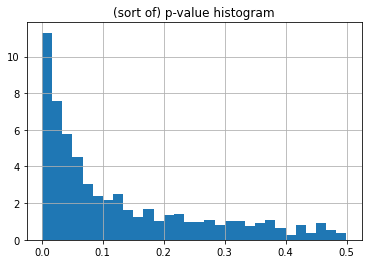

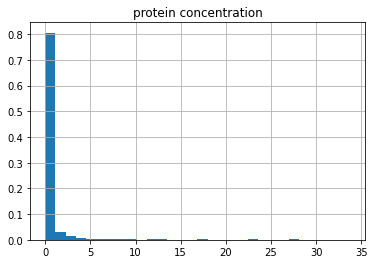

name
128up         1.206736
14-3-3zeta    3.831146
4E-T          0.081363
A16           0.018793
AGBE          1.121165
                ...   
yem           0.020002
yki           0.001806
yl            0.546893
yps           2.896051
yrt           0.011751
Name: concentration, Length: 936, dtype: float64


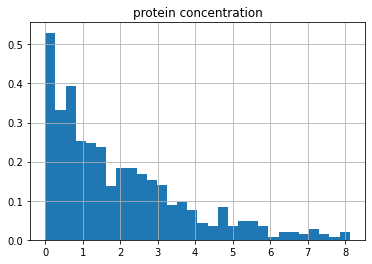

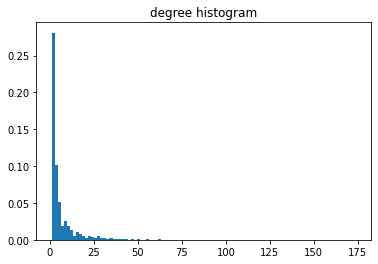

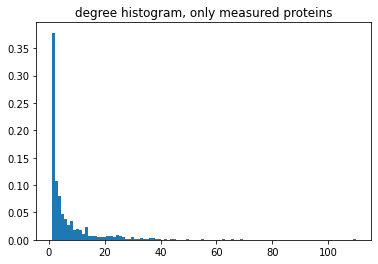

In [37]:
phospho_data['fold'].hist(density=True, bins=30)
plt.title("log-2 fold change histogram")
plt.show()

phospho_data['prob'].hist(density=True, bins=30)
plt.title("(sort of) p-value histogram")
plt.show()

phospho_data['concentration'].hist(density=True, bins=30)
plt.title("protein concentration")
plt.show()

print(phospho_data['concentration'])
phospho_data['concentration'] = np.log(1 + 100 * np.array(phospho_data['concentration']))
phospho_data['concentration'].hist(density=True, bins=30)
plt.title("protein concentration")
plt.show()


plt.hist([x[1] for x in ppi.degree], density=True, bins=100)
plt.title("degree histogram")
plt.show()

plt.hist([x[1] for x in ppi.degree if x[0] in phospho_data.index], density=True, bins=100)
plt.title("degree histogram, only measured proteins")
plt.show()

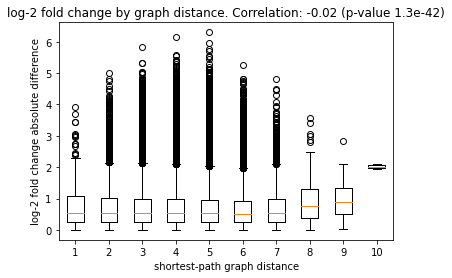

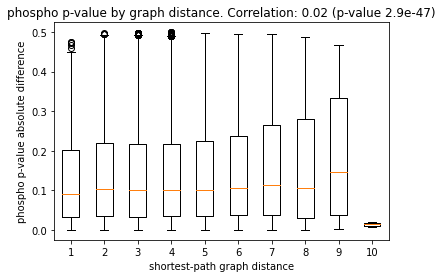

In [38]:
correlate_vertex_scores_with_distance(ppi, phospho_data['fold'], "log-2 fold change", True)

correlate_vertex_scores_with_distance(ppi, phospho_data['prob'], "phospho p-value", True)


In [39]:
# closeness_centrality = networkx.closeness_centrality(ppi)
closeness_centrality = {u: networkx.closeness_centrality(ppi, u) for u in phospho_data.index}
betweenness_centrality = networkx.betweenness_centrality(ppi)
betweenness_centrality = {u: betweenness_centrality[u] for u in phospho_data.index}
degree_centrality = networkx.degree(ppi)
degree_centrality = {u: degree_centrality[u] for u in phospho_data.index}
pagerank_centrality = networkx.pagerank(ppi)
pagerank_centrality = {u: pagerank_centrality[u] for u in phospho_data.index}

vertex_metrics = closeness_centrality, betweenness_centrality, degree_centrality, pagerank_centrality
vertex_metric_names = ["closeness", "betweenness", "degree_centrality", "pagerank_centrality"]

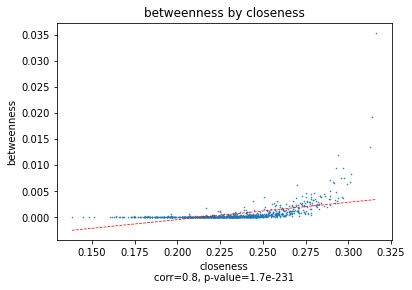

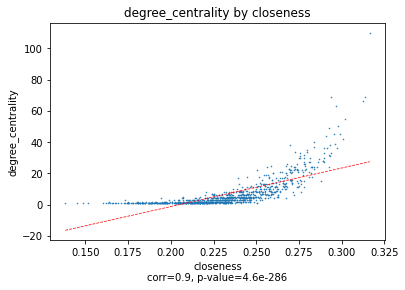

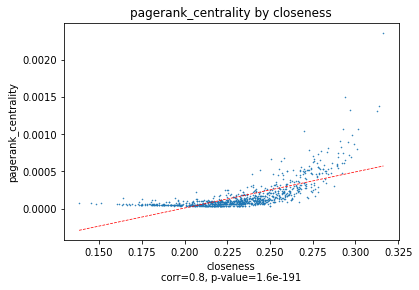

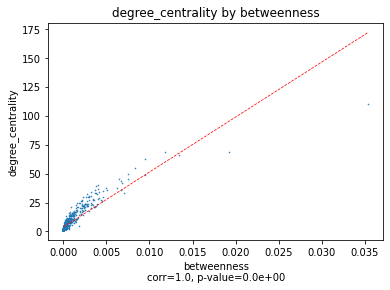

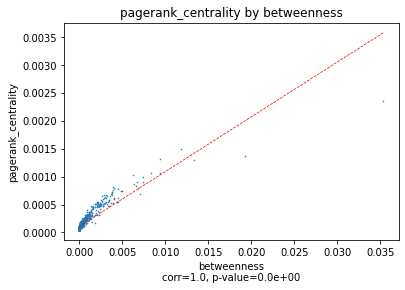

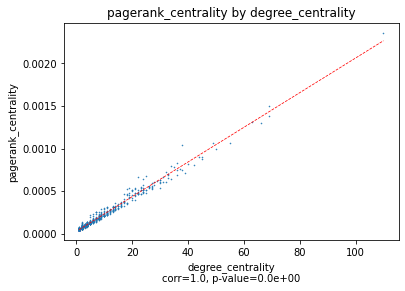

In [40]:
for (metric1, name1), (metric2, name2) in itertools.combinations(zip(vertex_metrics, vertex_metric_names), 2):
    plot_metrics_comparison(metric1, metric2, name1, name2, phospho_data.index)

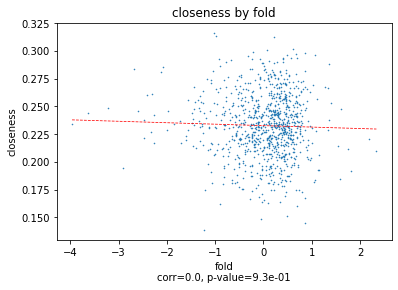

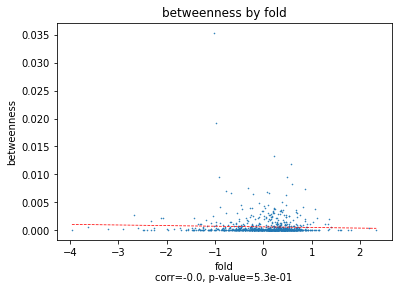

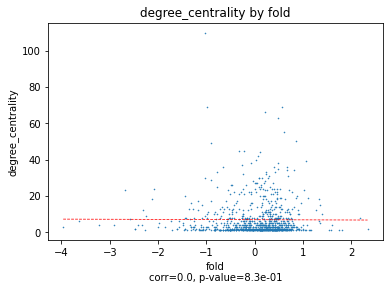

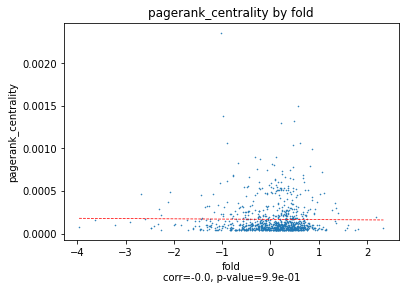

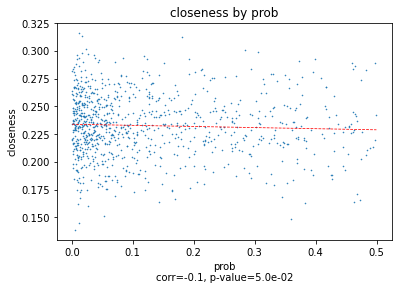

...

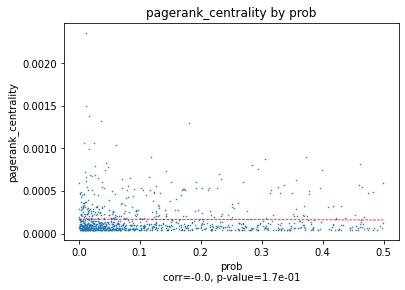

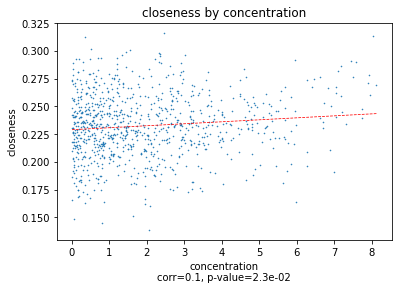

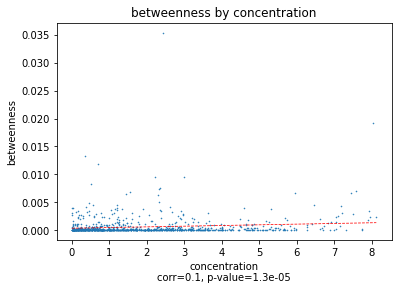

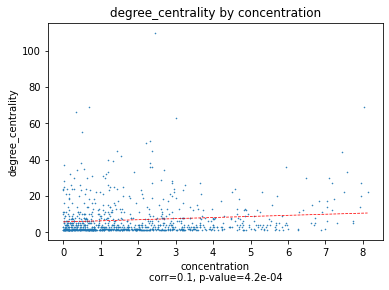

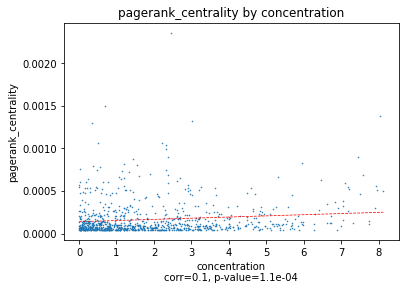

In [41]:
# Spearman correlation
for prot_metric_name in ['fold', 'prob', 'concentration']:
    prot_metric = phospho_data[prot_metric_name]
    for vertex_metric, vertex_metric_name in zip(vertex_metrics, vertex_metric_names):
        plot_metrics_comparison(prot_metric, vertex_metric, prot_metric_name, vertex_metric_name, phospho_data.index)


## Up/Down vertex analysis

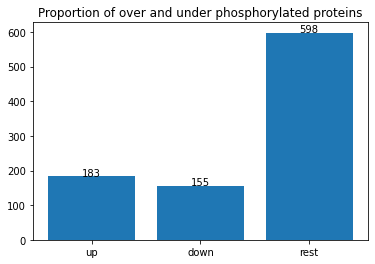

In [43]:
up_proteins, down_proteins = get_up_down_sets(phospho_data, val_threshold=0.16554107672, 
                                              p_threshold=0.041)
union_proteins = set(down_proteins).union(set(up_proteins))
prots = up_proteins, down_proteins, phospho_data.index

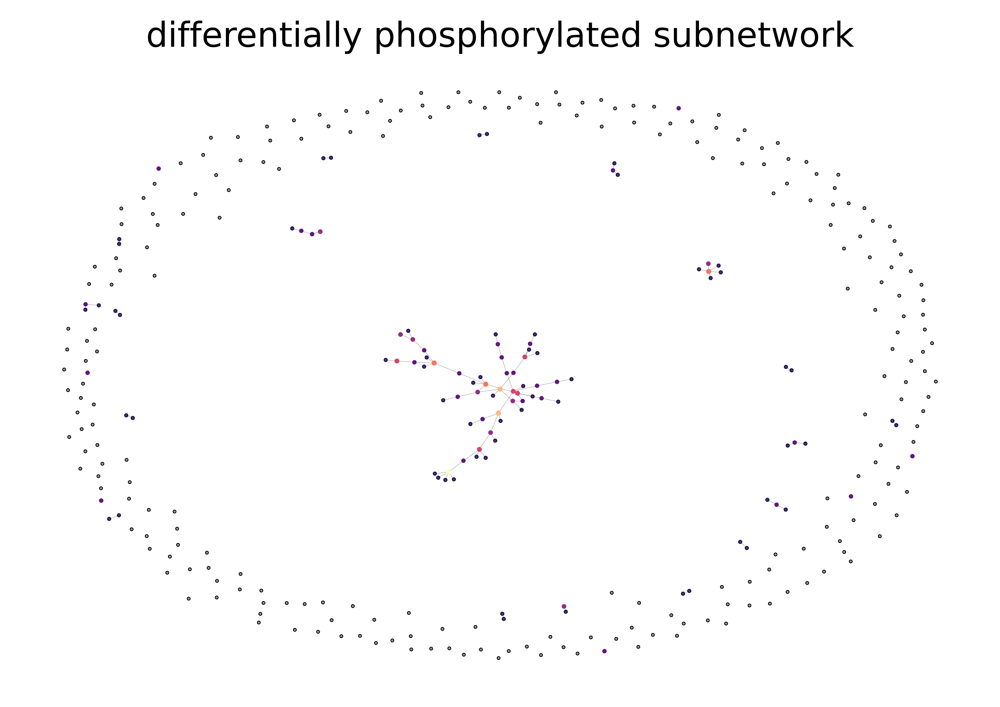

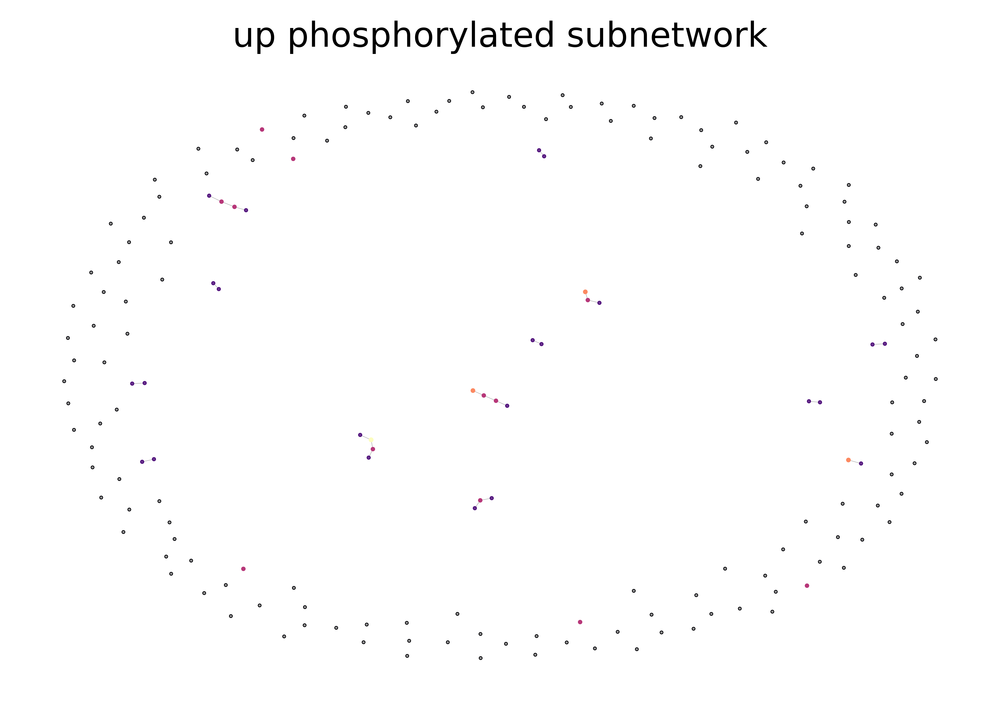

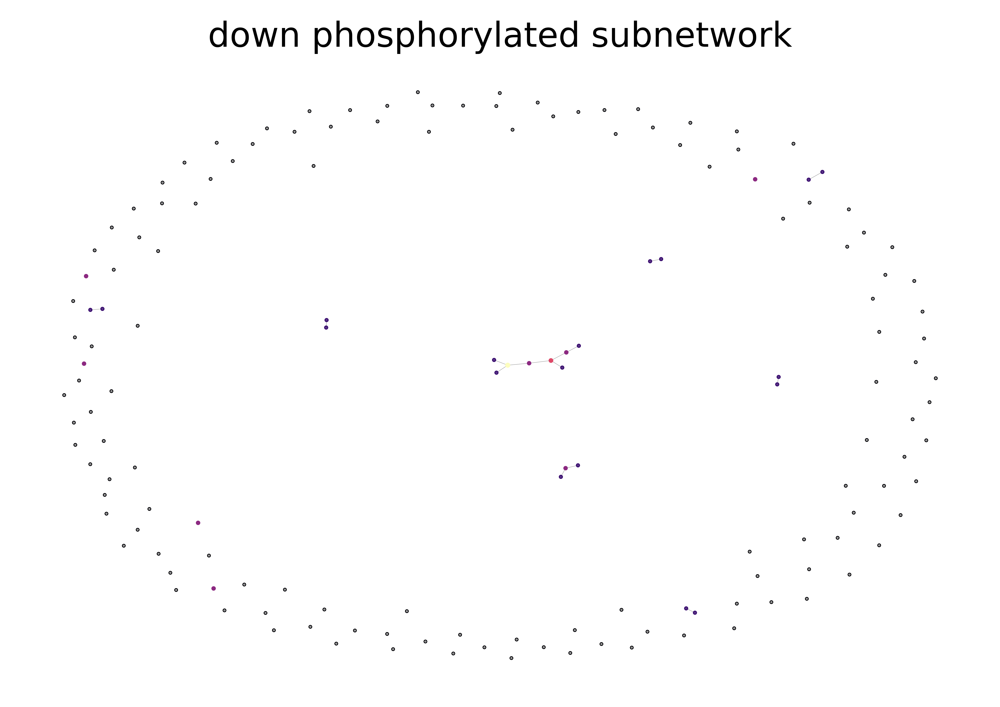

In [44]:
plot_network(networkx.subgraph(ppi, union_proteins), 
             "differentially phosphorylated subnetwork", "")
plot_network(networkx.subgraph(ppi, up_proteins), "up phosphorylated subnetwork", "")
plot_network(networkx.subgraph(ppi, down_proteins), "down phosphorylated subnetwork", "")

In [45]:
up_down_centrality_analysis(*prots, vertex_metrics, vertex_metric_names)

up down analysis for metric closeness
metric means: up: 2.35e-01, down: 2.36e-01, total: 2.33e-01
p-values (against full set): up: 1.56e-01, down: 9.88e-02

up down analysis for metric betweenness
metric means: up: 6.13e-04, down: 8.90e-04, total: 6.18e-04
p-values (against full set): up: 3.71e-01, down: 8.08e-02

up down analysis for metric degree_centrality
metric means: up: 7.39e+00, down: 7.51e+00, total: 6.85e+00
p-values (against full set): up: 2.28e-01, down: 1.79e-01

up down analysis for metric pagerank_centrality
metric means: up: 1.76e-04, down: 1.84e-04, total: 1.67e-04
p-values (against full set): up: 3.00e-01, down: 1.72e-01



## Up/Down subset analysis

In [50]:
subset_metrics = [fraction_of_internal_edges, 
                  normalized_internal_edges_size, 
                  average_empirical_shortest_path_len
#                   average_shortest_path_len,
                  # average_empirical_num_shortest_paths,
                  ]
subset_metric_names = ["fraction_of_internal_edges", 
                       "normalized_internal_edges_size",
                       "average_empirical_shortest_path_len",
#                        "average_shortest_path_len",
                       # "average_empirical_num_shortest_paths",
                       ]

Up proteins


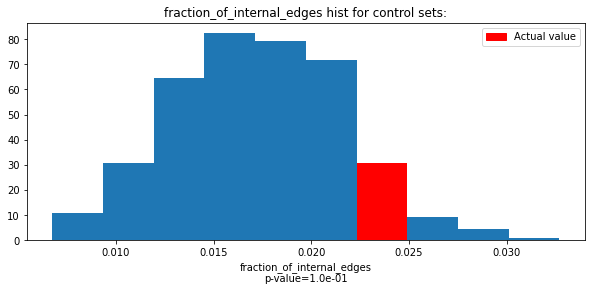

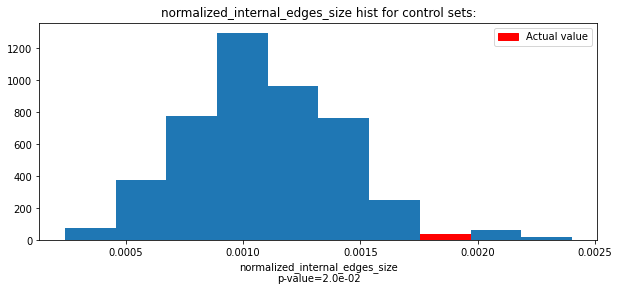

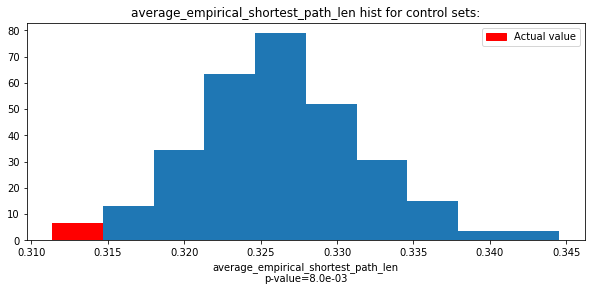

In [54]:
print("Up proteins")
topological_analysis(ppi, up_proteins, subset_metrics, subset_metric_names, random_iter=500)

Down proteins


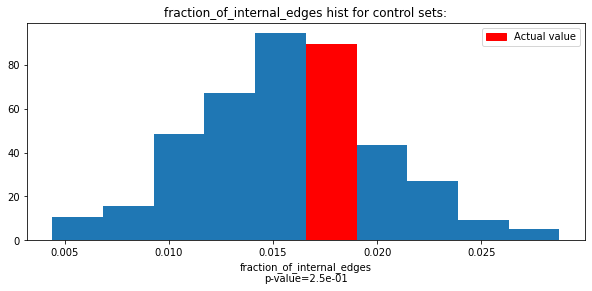

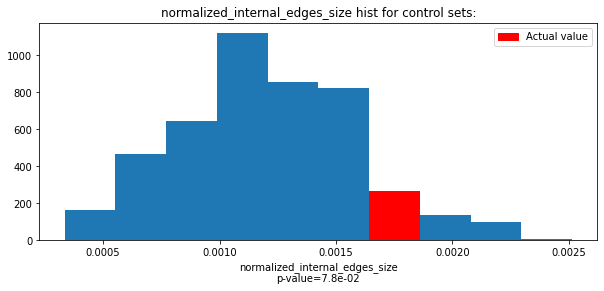

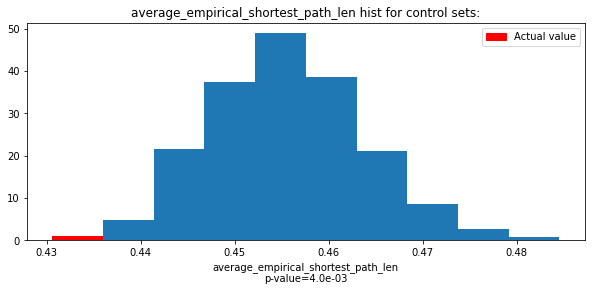

In [55]:
print("Down proteins")
topological_analysis(ppi, down_proteins, subset_metrics, subset_metric_names, random_iter=500)

Union proteins


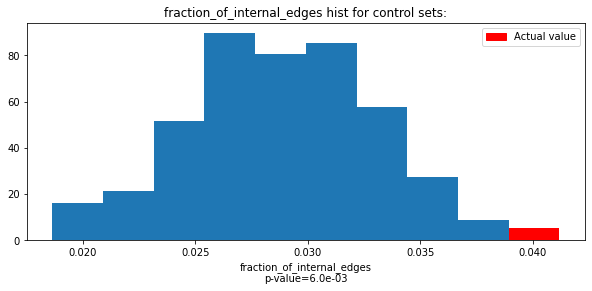

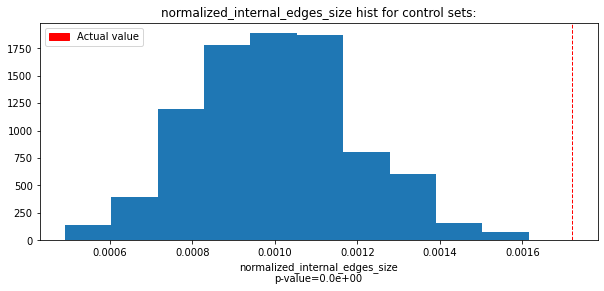

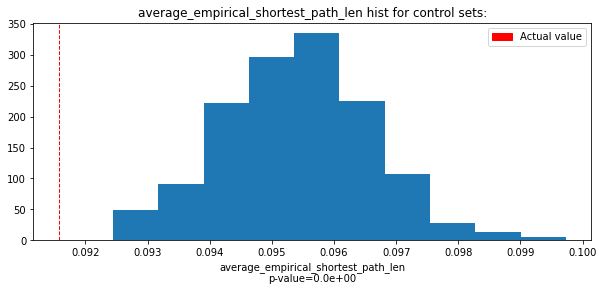

In [56]:
print("Union proteins")
topological_analysis(ppi, union_proteins, subset_metrics, subset_metric_names, random_iter=500)

Measured proteins


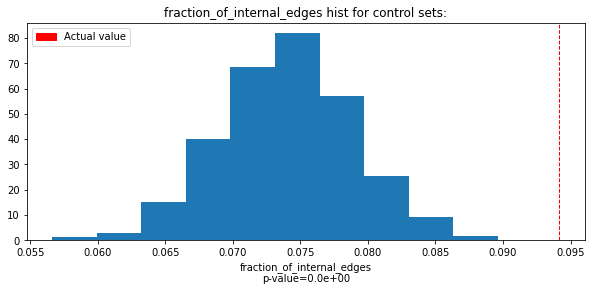

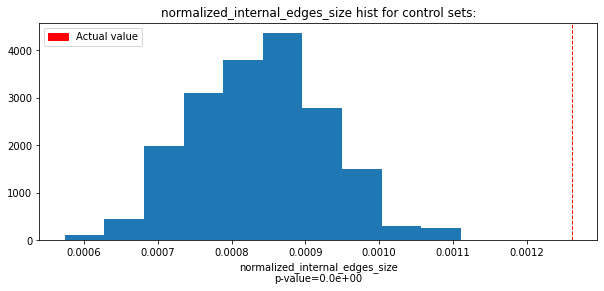

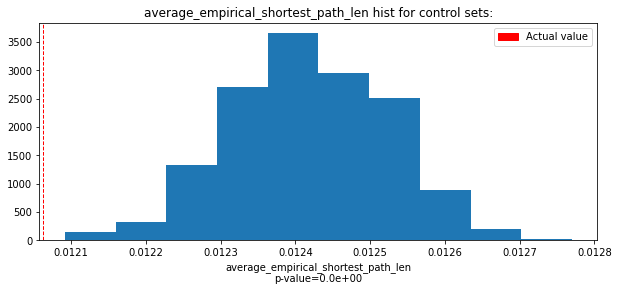

In [57]:
print("Measured proteins")
topological_analysis(ppi, phospho_data.index, 
                     subset_metrics, subset_metric_names, random_iter=500)

## Up/down set propagation

In [ ]:
seed_values = {n: (1 if n in up_proteins else 0) for n in ppi.nodes}
cross_validate_propagation(ppi, seed_values, method='heat',
                                    alpha=0.15, k=5, scoring='roc_auc',
                                    title_prefix='up proteins propagation', is_classifier=True)

seed_values = {n: (1  if n in down_proteins else 0) for n in ppi.nodes}
cross_validate_propagation(ppi, seed_values, method='heat',
                                    alpha=0.15, k=5, scoring='roc_auc',
                                    title_prefix='down proteins propagation', is_classifier=True)

seed_values = {n: (1  if n in union_proteins else 0) for n in ppi.nodes}
cross_validate_propagation(ppi, seed_values, method='heat',
                                    alpha=0.15, k=5, scoring='roc_auc',
                                    title_prefix='union proteins propagation', is_classifier=True)

seed_values = {n: (1  if n in phospho_data.index else 0) for n in ppi.nodes}
cross_validate_propagation(ppi, seed_values, method='heat',
                                    alpha=0.15, k=5, scoring='roc_auc',
                                    title_prefix='union proteins propagation', is_classifier=True)

## Fold propagation

In [ ]:
seed_values = {n: (phospho_data.loc[n]['fold']  if n in phospho_data.index else 1) for 
               n in ppi.nodes}
cross_validate_propagation(ppi, seed_values, method='heat', 
                                    alpha=0.15, k=5, scoring='explained_variance',
                           title_prefix='fold values propagate', is_classifier=False)

# make them non-negative
seed_values = {n: (np.log2(1 + np.exp(2, phospho_data.loc[n]['fold']))  if 
                   n in phospho_data.index else 0) for n in ppi.nodes}
cross_validate_propagation(ppi, seed_values, method='heat', 
                                    alpha=0.15, k=5, scoring='explained_variance',
                           title_prefix='fold values propagate', is_classifier=False)

# make them in range [0, 1]
seed_values = (phospho_data['fold'] - np.min(phospho_data['fold']))/np.ptp(phospho_data['fold'])
seed_values = {n: seed_values[n] if n in seed_values else 0 for n in ppi.nodes}
seed_values = {n: (np.log2(1 + np.exp(2, phospho_data.loc[n]['fold']))  if 
                   n in phospho_data.index else 0) for n in ppi.nodes}


## Prob propagation

In [ ]:
# TODO: think of what to do with propagation when values aren't centered around 0
# or positive (or in general deal with missing values)

seed_values = {n: (phospho_data.loc[n]['prob']  if n in phospho_data.index else 1) for 
               n in ppi.nodes}
cross_validate_propagation(ppi, seed_values, method='heat', 
                                    alpha=0.15, k=5, scoring='explained_variance',
                           title_prefix='prob values propagate', is_classifier=False)

# use 1-prob
seed_values = {n: (1 - phospho_data.loc[n]['prob']  if n in phospho_data.index else 0) for 
               n in ppi.nodes}
cross_validate_propagation(ppi, seed_values, method='heat', 
                                    alpha=0.15, k=5, scoring='explained_variance',
                           title_prefix='prob values propagate', is_classifier=False)
